## NUID: 001535622 Xinlin Ying
### Import Library

In [1]:
import os
import math
import pandas as pd
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

### Prework: Import database
A research institute made a random sampling test by deploying 42 monitoring points on the body of the elderly subjects. See the layout of the points indicated as follows the following pictures.
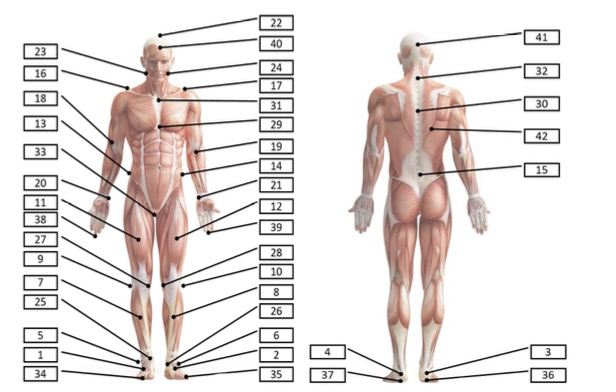
We have 2 type of databases, one is annex1 including basic Data of Elderly People contains the basic data of all the elderly subjects.Annex 2: Annex 2 contains the calibrated raw data of each subject in free walk state. We can get information of Sex, Age and BMI.

In [2]:
annex1=pd.read_excel('./Data/Annex1.xlsx')
annex1

,Number,Name,Sex,Age,Height,Weight,BMI,Fall times in one year,步高,摇晃,...,5°.2,10°,10°.1,10°.2,15°,15°.1,15°.2,High pressure,Low pressure,Heart rate
0,2,wenyanfang,Female,81,158.2,57.7,23.054879,3,88.6441,11,...,NaN,10,NaN,NaN,15.1,NaN,NaN,NaN,NaN,NaN
1,3,yangxijin,Male,72,165.4,66.4,24.271525,3,173.2410,10,...,NaN,10.0-10.2,NaN,NaN,15.0-14.9,NaN,NaN,NaN,NaN,NaN
2,4,hanwenshan,Male,74,167.6,61.5,21.894099,0,107.4518,12,...,NaN,10.3-10.4,NaN,NaN,15.1-15.1,NaN,NaN,NaN,NaN,NaN
3,6,pengguizhu,Female,74,149.3,59.2,26.558411,0,85.5140,10,...,NaN,10.2-10.2,NaN,NaN,15.1-15.1,NaN,NaN,NaN,NaN,NaN
4,7,wangfulan,Female,76,146.2,55.0,25.731668,0,98.7777,10,...,NaN,10.1-10.3,NaN,NaN,15.0-15.1,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,76,lvjun,Female,64,165.6,61.1,22.280275,0,100.5104,12,...,5.1-5.1,10.2-10.4,10.3-10.4,10.3-10.3,15.1-15.2,15.1-15.2,15.1-15.1,138.0,81.0,65.0
68,77,litongsheng,Male,66,173.6,69.6,23.094566,0,141.7970,4,...,5.1-5.2,10.1-10.1,10.2-10.3,10.2-10.3,15.0-15.0,15.0-14.9,15.0-15.0,124.0,77.0,73.0
69,78,maochengai,Female,66,158.4,52.9,21.083627,0,159.0000,9,...,5.2-5.3,10.1-10.2,10.1-10.2,10.2-10.3,15.0-15.1,15.1-15.2,15.1-15.1,102.0,75.0,75.0
70,79,zonglanfang,Female,60,163.1,68.9,25.900688,1,119.5584,12,...,5.3-5.2,10.0-10.1,10.1-10.2,10.1-10.0,15.2-15.2,15.2-15.4,15.2-15.2,95.0,72.0,87.0


we have 76 elderly people's information. The first column is frame sequence and the second column is time. Beginning from the third column, every three columns stands for the coordinates of motion of a monitoring point (x, y, z). There are 42 monitoring points in all.

In [3]:
sample = pd.read_excel('./Data/Excel/maochengai_g9.xlsx')
sample

,1.00000,0.00000,-557.32654,269.89255,48.54157,-227.38641,331.46207,70.94316,-685.67212,262.07718,...,587.07007,-189.08934,238.20013,1413.07605,-406.81906,230.59665,1457.11182,-514.14886,186.82465,1033.76208
0,2,0.017,-556.85742,270.24994,48.80820,-186.72252,331.29080,71.95646,-684.77484,262.54068,...,587.84680,-176.17348,238.12932,1410.78442,-393.65210,230.09039,1455.21838,-501.96378,186.35846,1032.18884
1,3,0.033,-556.25354,270.51556,49.17597,-146.85133,330.75714,73.48957,-683.74030,262.87228,...,588.79346,-163.04224,238.16901,1408.57532,-380.32318,229.65865,1453.41577,-489.54208,186.06731,1030.61633
2,4,0.050,-555.43835,270.61197,49.72260,-108.47112,329.63440,75.85897,-682.46838,262.93790,...,590.07379,-149.54938,238.35368,1406.50635,-366.69681,229.37108,1451.78723,-476.68359,186.07344,1029.06384
3,5,0.067,-554.39929,270.48544,50.49621,-72.18196,327.90225,79.05794,-680.90649,262.61102,...,591.80994,-135.61971,238.66667,1404.62476,-352.68005,229.28900,1450.39294,-463.23730,186.43117,1027.57410
4,6,0.083,-553.14453,270.11124,51.51911,-38.53828,325.72198,82.75195,-679.02844,261.79865,...,594.00928,-121.22062,239.10751,1402.99231,-338.22253,229.46570,1449.25354,-449.08722,187.13875,1026.19165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,150,2.483,2347.42676,264.48154,98.71826,2501.48267,345.39154,66.10336,2237.22461,268.24829,...,637.11810,2523.04663,258.67200,1479.34863,2303.90137,291.51602,1476.68054,2248.80029,249.96581,1054.88232
149,151,2.500,2396.13574,262.34897,93.55901,2501.89526,344.42819,65.96379,2279.59351,269.35361,...,645.74872,2536.65991,256.34326,1480.29065,2317.98193,291.65002,1477.71875,2260.99023,251.34555,1056.49170
150,152,2.517,2445.06689,260.39868,88.82182,2502.37280,343.49475,65.87884,2323.32080,270.87585,...,654.85516,2549.84961,253.83545,1481.12354,2331.68970,291.65579,1478.44824,2273.01489,252.74875,1057.82153
151,153,2.533,2493.79346,258.73135,84.65279,2502.90112,342.60110,65.82365,2368.10205,272.80670,...,664.21100,2562.68750,251.18990,1481.86938,2345.08545,291.57104,1478.90869,2284.95728,254.19139,1058.87183


In [4]:
#column
sample.shape[0]

153

In [5]:
#row 
sample.shape[1]

128

### Part I: Extract 25 points from 42 given data
This parameter means what we use to analyse the elderly's gesture.In this model we use the X coordinate to predict whetehr a old people will fall down or not. We use corr to check the correlation within each points to extract the enough point we need. In 42 points there are 25 points' data are useful for us. Other points can be replace or represent by the other point.

In [6]:
paraIndex = -1

In [7]:
sample2=sample.iloc[:,[i%3==2 for i in range(len(sample.columns))]]
sample2.corr().head()
# i%2==0 for i in range(len(df.columns))]]

,-557.32654,-227.38641,-685.67212,-363.27985,-644.60413,-322.53128,-498.24460,-215.96461,-507.15237,-227.77223,...,-320.86774,-477.93857,-157.68350,-698.56879,-370.49844,-274.58038,-460.55789,-189.08934,-406.81906,-514.14886
-557.32654,1.000000,0.896845,0.999640,0.901927,0.999859,0.900380,0.993628,0.933799,0.990374,0.943762,...,0.972467,0.999601,0.889749,0.999817,0.897914,0.927807,0.996591,0.971802,0.971661,0.972458
-227.38641,0.896845,1.000000,0.902351,0.999734,0.900373,0.999896,0.930553,0.993319,0.937206,0.988433,...,0.971414,0.890836,0.999666,0.898161,0.999859,0.994435,0.908091,0.972809,0.972958,0.971692
-685.67212,0.999640,0.902351,1.000000,0.907211,0.999942,0.905793,0.995721,0.938407,0.993018,0.948083,...,0.976055,0.998501,0.895545,0.999921,0.903247,0.932819,0.998096,0.975440,0.975300,0.976071
-363.27985,0.901927,0.999734,0.907211,1.000000,0.905349,0.999952,0.934627,0.995093,0.941057,0.990813,...,0.974538,0.896185,0.998822,0.903116,0.999932,0.995831,0.912602,0.975638,0.975776,0.974720
-644.60413,0.999859,0.900373,0.999942,0.905349,1.000000,0.903865,0.994962,0.936860,0.992047,0.946665,...,0.974841,0.999019,0.893418,0.999966,0.901359,0.931149,0.997512,0.974165,0.974023,0.974834


In [8]:
plt.subplots(figsize=(25,25),dpi=1080,facecolor='w')
fig=sns.heatmap(sample2.corr(),annot=True, vmax=1, square=True, cmap="Blues", fmt='.2g')
fig

<AxesSubplot: >

Now we have the 25 points' data
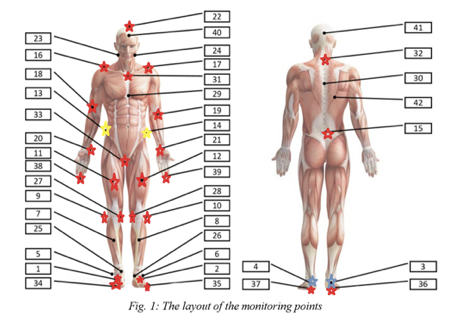


#### In this model, We found these 25 points for the body center of gravity and balance point influence factors by referring to the study [1]  


| The body parts | Coefficient | Origin of coordinates（right；left） |
| --- | --- | --- |
| The center of gravity of the Head  | 0.0706 | The average of part 41 and part 42 |
| shoulders  | 0.0356 | The average of part 16 and part 17 |
| The midpoint of the shoulder line  | 0.2391 | The average of part 16 and part 17 |
| elbows  | 0.0580 | The average of part 18 and part 19 |
| wrists  | 0.0192 | The average of part 20 and part 21 |
| The center of gravity of the hands  | 0.0180 |The average of part 20 and part 38；The average of part 21 and part 39|
| hip | 0.1297 |15|
| The midpoint of the hip line | 0.1879 |The average of part 13 and part 14|
| knees | 0.1630 |The average of part 9 and part 27；The average of part 10 and part 28|
| ankles | 0.0643 |The average of part 5 and part 25；The average of part 6 and part 26|
| heels | 0.0158 |36 ; 37|

## Part II: Calculate the center of gravity
This is the formula for calculating the position of the center of gravity.We have the return result **point1** caculating the times that left and right swing range is over the normal value, **point2** caculating the times that updown swing range is over the normal value  and the value of position of gravity **res**.  
Due to the fact that the actual data has the phenomenon of patch upshift, we regard the point satisfying the following formula as the maximum biggest foot height:
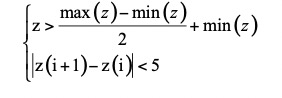
The point satisfying the following equation is the minimum foot height:
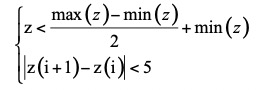

In [9]:
def caculate(sample):  
    res =(sample.iloc[:,41*3+paraIndex] + sample.iloc[:,42*3+paraIndex])/2*0.0706 + (sample.iloc[:,16*3+paraIndex] + sample.iloc[:,17*3+paraIndex])/2*(0.0356 + 0.2391) + (sample.iloc[:,18*3+paraIndex] + sample.iloc[:,19*3+paraIndex])/2*0.0580 + (sample.iloc[:,20*3+paraIndex] + sample.iloc[:,21*3+paraIndex])/2*0.0192 + (sample.iloc[:,38*3+paraIndex] + sample.iloc[:,20*3+paraIndex]+sample.iloc[:,39*3+paraIndex] + sample.iloc[:,21*3+paraIndex])/4*0.0180 + sample.iloc[:,15*3+paraIndex] * 0.1297 + (sample.iloc[:,13*3+paraIndex] + sample.iloc[:,14*3+paraIndex])/2*0.1879 + (sample.iloc[:,9*3+paraIndex] + sample.iloc[:,27*3+paraIndex]+sample.iloc[:,10*3+paraIndex] + sample.iloc[:,28*3+paraIndex])/4*0.1630 + (sample.iloc[:,5*3+paraIndex] + sample.iloc[:,25*3+paraIndex]+sample.iloc[:,6*3+paraIndex] + sample.iloc[:,26*3+paraIndex])/4*0.0643 + (sample.iloc[:,36*3+paraIndex] + sample.iloc[:,37*3+paraIndex])/2*0.0158
    maxZ = res.max()
    minZ = res.min()
    point1 = 0
    point2 = 0
    for i in range(res.shape[0]-1):
        item = res.loc[i]
        nextItem = res.loc[i+1]
        if item <= (res.max()-res.min())/2+res.min():
            point1 = point1 + 1
        if abs(nextItem - item) >=5:
            point2 = point2 + 1
    return res,point1,point2

We calculate the 3 parameters for all databases we have for the old people.

In [10]:
point1List = []
point2List = []
name = []
for fname in os.listdir('./Data/Excel'):
    if (fname[:-8] in annex1['Name'].values):
        newSample = pd.read_excel('./Data/Excel/' + fname)
        res,point1,point2 = caculate(newSample)
        point1List.append(point1)
        point2List.append(point2)
        name.append(fname[:-8])

In [11]:
fallNumbers = []
for n in name:
    fallNumbers.append(int(annex1.loc[(annex1['Name']==n)]['Fall times in one year']))

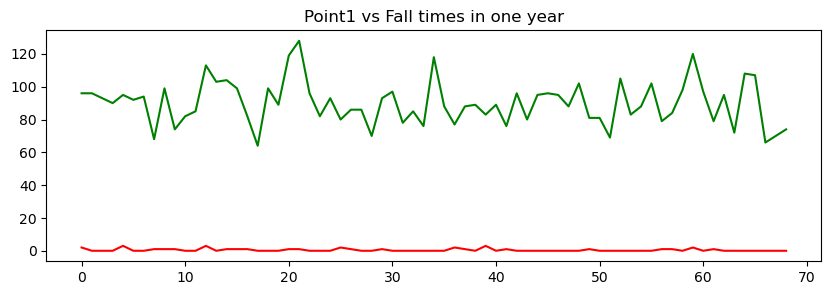

In [12]:
plt.figure(figsize=(10, 3))
plt.title('Point1 vs Fall times in one year')
plt.plot(range(0,69),point1List,color = 'green')
plt.plot(range(0,69),fallNumbers,color = 'red')

We plot the **point1** and the **fall times in one year** in the same image but the difference between them are too big so we **normalization** these two series.

In [13]:
def normalization(data):
    _range = np.max(data) - np.min(data)
    return (data - np.min(data)) / _range

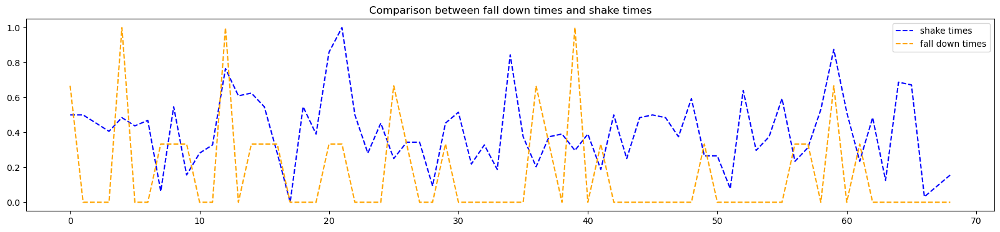

In [14]:
plt.figure(figsize=(20, 4))
plt.plot(range(0,69),normalization(point1List),color = 'blue',linestyle='--',label = 'shake times')
plt.plot(range(0,69),normalization(fallNumbers),color = 'orange',linestyle='--',label = 'fall down times')
plt.title('Comparison between fall down times and shake times')
plt.legend()
plt.show()

Use pearson correlation coefficient to analysis the the connection between swing range and fall down times. p value is small which means they have strong connections.

In [15]:
import scipy.stats as stats
stats.pearsonr(fallNumbers,point1List)

PearsonRResult(statistic=0.12478894933391799, pvalue=0.3069522680264505)

## Part III: Use Random forests analysis the impact factor 
Machine Learning (ML) is cool. It's what AI is all about. It's a bit of reverse Science: Instead of building a *theoretical model* with traditional Science, and then use that theoretical model to predict the future, we use data and from that data we build a *statistical model* of the data, and then use *that* model to predict the future. It's so cool, we need a preview of this.Here we show an example of how well `Scikit-learn` and `pandas` integrate to do Machine Learning (`Scikit-learn`) from data (`pandas`).

<br />
Random forests (RF) are cool,invented in the 1950s (as a **decision tree** algorithm) and optimized using [ensembling](https://en.wikipedia.org/wiki/Ensemble_learning) in modern libraries like Scikit-Learn
<br />


In [16]:
BMI = []
AGE = []
for n in name:
    BMI.append(int(annex1.loc[(annex1['Name']==n)]['BMI']))
    AGE.append(int(annex1.loc[(annex1['Name']==n)]['Age']))

In [17]:
X = pd.DataFrame({'Swing range': point1List, 'Age': AGE, 'BMI': BMI})
X

,Swing range,Age,BMI
0,96,78,29
1,96,74,21
2,93,68,26
3,90,66,22
4,95,72,24
...,...,...,...
64,108,66,32
65,107,64,23
66,66,64,23
67,70,61,26


In [18]:
X.T

,0,1,2,3,4,5,6,7,8,9,...,59,60,61,62,63,64,65,66,67,68
Swing range,96,96,93,90,95,92,94,68,99,74,...,120,97,79,95,72,108,107,66,70,74
Age,78,74,68,66,72,60,76,66,70,73,...,66,63,61,65,65,66,64,64,61,66
BMI,29,21,26,22,24,29,25,22,23,18,...,26,23,29,35,25,32,23,23,26,21


In [19]:
y = pd.DataFrame({'Fall times in one year': normalization(fallNumbers)})
y

,Fall times in one year
0,0.666667
1,0.000000
2,0.000000
3,0.000000
4,1.000000
...,...
64,0.000000
65,0.000000
66,0.000000
67,0.000000


Let's create our *training* **independent variables** (X_train) and *test* **independent variables** (X_test), and our *training* **dependent variable** (y_train) and *test* **dependent variable** (y_test). 
Notice how I use an uppercase X to denote that X is multi-dimensional, while I use a lowercase y to denote that y is one-dimensional.
We need to remove the timestamp from the training data, as it is not relevant to our model. Each different timestamped row is just another ***observation***. 

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=21)
# Create a model 
rf_model = RandomForestRegressor()
# Train the model
rf_model.fit(X_train, y_train)
# Get R2 measure (indicator of accuracy 1 is perfect, 0 is horrible) 
1 + rf_model.score(X_test, y_test)

/var/folders/wm/1kvlb8n53p53j5k1k_p1fwk80000gn/T/ipykernel_27595/3517488194.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf_model.fit(X_train, y_train)


0.6115680851063829

Now we create a ML model, using `RandomForestRegressor` from the `sk-learn` package.
That's *one* line of code in `Scikit-learn`.

Then, we fit the model to the training data (that's the ***training step***). That is where we fit a **curve** to the **datapoints**. This is where we do function approximation. We try to find the function that fits through our data.
That's *another* line of code in `Scikit-learn`.

Above are your four lines of code that do *everything*:

In [21]:
sorted(zip(X.columns, rf_model.feature_importances_),
        key=lambda x: x[1], reverse=True)

[('Swing range', 0.384896320242243),
 ('Age', 0.34195393557629516),
 ('BMI', 0.273149744181462)]

What are the most important features in predicting whether a old people will fall down? We can get that from the `feature_importances_` API. And we got the coefficient for every factor. It looks Swing range is the most important factor and BMI is almost equal to the Age factor.

In [22]:
NewSample = pd.DataFrame({'Swing range': point1List, 'Age': AGE, 'BMI': BMI,'Fall times in one year': fallNumbers})
NewSample

,Swing range,Age,BMI,Fall times in one year
0,96,78,29,2
1,96,74,21,0
2,93,68,26,0
3,90,66,22,0
4,95,72,24,3
...,...,...,...,...
64,108,66,32,0
65,107,64,23,0
66,66,64,23,0
67,70,61,26,0


## Part IV: Evaluation of modules using the entropy weighting method
he EWM is one of the weighting methods that measures the dispersion level of different information sources in decision making. It has been widely used in comprehensive evaluation studies where the weights of different indexes are determined according to the entropy value of the different evaluation indexes.  
**Step 1** Firstly, the data is preprocessed to remove the data dimension. The specific method is as follows:  
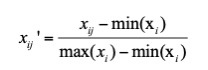


In [23]:
def StandardizedMetrics(BMI,AGE,point1List):
    maxBMI = max(BMI)
    minBMI = min(BMI)
    
    maxSwingRange = max(point1List)
    minSwingRange = min(point1List)
    
    maxAge = max(AGE)
    minAge = min(AGE)
    
    for a in range(len(AGE)):
        AGE[a] = (maxAge - AGE[a])/(maxAge - minAge)
    AgeSum = sum(AGE)
    for a2 in range(len(AGE)):
        AGE[a2] =AGE[a2]/AgeSum
        
    for a in range(len(BMI)):
        BMI[a] = (BMI[a] - minBMI)/(maxBMI - minBMI)
    BMISum = sum(BMI)
    for a2 in range(len(BMI)):
        BMI[a2] = BMI[a2]/BMISum
    
    for a in range(len(point1List)):
        point1List[a] = (maxSwingRange - point1List[a])/(maxSwingRange - minSwingRange)
    point1ListSum = sum(point1List)
    for a2 in range(len(point1List)):
        point1List[a2] = point1List[a2]/point1ListSum

In [24]:
StandardizedMetrics(BMI,AGE,point1List)

**Step 2** Calculate the entropy of each index
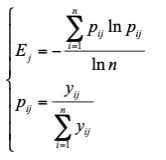

In [25]:
def entropyOfEachIndex(database):
    np.round(database, 2)
    count = 0
    for b in database:
        if(b != 0):
            count = count + b * math.log(b)
        else:
            count = count + 0
    return - count/math.log(len(database))

In [26]:
Entropy = [entropyOfEachIndex(AGE),entropyOfEachIndex(point1List),entropyOfEachIndex(BMI)]
Entropy

[0.9844776283200536, 0.9827204507843179, 0.9724703485877743]

**Step 3** Calculate the weight of each index
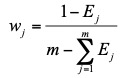

In [27]:
def weightOfEachIndex(Entropy):
    result = []
    for e in Entropy:
        result.append((1-e)/(len(Entropy) - sum(Entropy)))
    return result

In [29]:
weightOfEachIndex(Entropy)

[0.2572843883587245, 0.2864097280195131, 0.4563058836217643]

We can see the value of age, swing range and BMI is around 0.26, 0.28, 0.46, which is close to the random forest algorithm result, 0.24, 0.38 and 0.38. Means the Random forest give a good analysis. This result also indicates that age,  are not that important when consider whether a old people will fall down or not. What's most important is the gesture and the situation of the old people.

#### References  
[1]、Center of gravity: 王蔚, 冯亚琴, 杨再兴,等. 基于体感交互设备的人体重心计算方法[J]. 数据采集与处理, 2018, 33(4):8.  
                        Tan M，Nitz J，Boughen J，et al.Centre of gravity position in bipedal steady-stance is asociated with performance of timed up and go but not functional reach[J].Physiotherapy，2015，101(1):e1485-e1485.
                        
[2]、Dataset: http://www.apmcm.org/detail/2316

[3]Duan Zengwu. Capturing and Application of Human Motion Information Based on Kinect[D]. Hebei: Hebei university.

[4]Jiao shanshan. Influence of aging on body dynamic posture stability at the start of walk-ing [D]. Tianjin institute of physical education, 2017.
[5]Random Forest: https://en.wikipedia.org/wiki/Ensemble_learning

### copyright
copyright (c) 2022, Xinlin Ying All rights reserved.

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

